# 人脸生成（Face Generation）
在该项目中，你将使用生成式对抗网络（Generative Adversarial Nets）来生成新的人脸图像。
### 获取数据
该项目将使用以下数据集：
- MNIST
- CelebA

由于 CelebA 数据集比较复杂，而且这是你第一次使用 GANs。我们想让你先在 MNIST 数据集上测试你的 GANs 模型，以让你更快的评估所建立模型的性能。

如果你在使用 [FloydHub](https://www.floydhub.com/), 请将 `data_dir` 设置为 "/input" 并使用 [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data/'
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## 探索数据（Explore the Data）
### MNIST
[MNIST](http://yann.lecun.com/exdb/mnist/) 是一个手写数字的图像数据集。你可以更改 `show_n_images` 探索此数据集。

(25, 28, 28, 3)


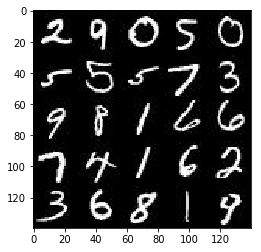

In [2]:
show_n_images = 25

%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot
import numpy as np

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'), cmap='gray')
print(mnist_images.shape)

### CelebA
[CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) 是一个包含 20 多万张名人图片及相关图片说明的数据集。你将用此数据集生成人脸，不会用不到相关说明。你可以更改 `show_n_images` 探索此数据集。

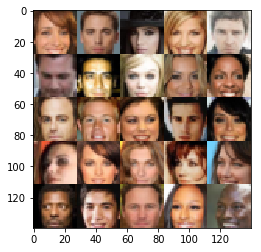

In [3]:
show_n_images = 25
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## 预处理数据（Preprocess the Data）
由于该项目的重点是建立 GANs 模型，我们将为你预处理数据。

经过数据预处理，MNIST 和 CelebA 数据集的值在 28×28 维度图像的 [-0.5, 0.5] 范围内。CelebA 数据集中的图像裁剪了非脸部的图像部分，然后调整到 28x28 维度。

MNIST 数据集中的图像是单[通道](https://en.wikipedia.org/wiki/Channel_(digital_image%29)的黑白图像，CelebA 数据集中的图像是 [三通道的 RGB 彩色图像](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images)。

## 建立神经网络（Build the Neural Network）
你将通过部署以下函数来建立 GANs 的主要组成部分:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### 检查 TensorFlow 版本并获取 GPU 型号
检查你是否使用正确的 TensorFlow 版本，并获取 GPU 型号

In [4]:

from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# 检查 tensorflow 版本
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# 检查GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.2.0-rc1
Default GPU Device: /gpu:0


### 输入（Input）
部署 `model_inputs` 函数以创建用于神经网络的 [占位符 (TF Placeholders)](https://www.tensorflow.org/versions/r0.11/api_docs/python/io_ops/placeholders)。请创建以下占位符：
- 输入图像占位符: 使用 `image_width`，`image_height` 和 `image_channels` 设置为 rank 4。
- 输入 Z 占位符: 设置为 rank 2，并命名为 `z_dim`。
- 学习速率占位符: 设置为 rank 0。

返回占位符元组的形状为 (tensor of real input images, tensor of z data, learning rate)。


In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    inputs_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='inputs_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    learning_rate = tf.placeholder(tf.float32, (None))
    
    return inputs_real, inputs_z, learning_rate


### 辨别器（Discriminator）
部署 `discriminator` 函数创建辨别器神经网络以辨别 `images`。该函数应能够重复使用神经网络中的各种变量。 在 [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) 中使用 "discriminator" 的变量空间名来重复使用该函数中的变量。 

该函数应返回形如 (tensor output of the discriminator, tensor logits of the discriminator) 的元组。

In [6]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """

    alpha = 0.2
    with tf.variable_scope('discriminator', reuse = reuse):
        x1 = tf.layers.conv2d(images, 64, 5, strides = 2, padding='same')
        x1 = tf.layers.batch_normalization(x1, training = True)
        x1 = tf.maximum(alpha * x1, x1)
        
        x2 = tf.layers.conv2d(x1, 128, 5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training = True)
        x2 = tf.maximum(alpha * x2, x2)
        
        x3 = tf.layers.conv2d(x2, 256, 5, strides = 2, padding = 'same')
        x3 = tf.layers.batch_normalization(x3, training = True)
        x3 = tf.maximum(alpha * x3, x3)
        
        x4 = tf.reshape(x3, (-1, int(x3.shape[1]) * int(x3.shape[2]) * int(x3.shape[3])))
        
        logits = tf.layers.dense(x4, 1)
        out = tf.nn.sigmoid(logits)
        
    return out, logits

### 生成器（Generator）
部署 `generator` 函数以使用 `z` 生成图像。该函数应能够重复使用神经网络中的各种变量。
在 [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) 中使用 "generator" 的变量空间名来重复使用该函数中的变量。 

该函数应返回所生成的 28 x 28 x `out_channel_dim` 维度图像。

In [7]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """

    reuse = not is_train
    alpha=0.2
    with tf.variable_scope('generator', reuse=reuse):

        x1 = tf.layers.dense(z, 4*4*512)
        x1 = tf.reshape(x1, (-1, 4, 4, 512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(0.2 * x1, x1)
        # 4x4x512 

        x2 = tf.layers.conv2d_transpose(x1, 256, 4, strides=1, padding='valid')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(0.2 * x2, x2)
        # 7x7x256 

        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(0.2 * x3, x3)
        # 14x14x128 now

        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 5, strides=2, padding='same')
        # 28x28x3 now
        out = tf.tanh(logits)
        
    return out


### 损失函数（Loss）
部署 `model_loss` 函数训练并计算 GANs 的损失。该函数应返回形如 (discriminator loss, generator loss) 的元组。

使用你已实现的函数：
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """

    smooth = 0.1
    
    fake_images = generator(input_z, out_channel_dim, is_train = True)
    real_out, real_logits = discriminator(input_real, reuse = False)
    fake_out, fake_logits = discriminator(fake_images, reuse = True)
    
    
    d_real_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(
            logits = real_logits, labels = tf.ones_like(real_logits) * (1 - smooth)))
    d_fake_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(
            logits = fake_logits, labels = tf.zeros_like(fake_logits) * (1 - smooth)))
    d_loss = d_real_loss + d_fake_loss
    
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(
        logits = fake_logits, labels = tf.ones_like(fake_logits)))
    
    
    return d_loss, g_loss


### 优化（Optimization）
部署 `model_opt` 函数实现对 GANs 的优化。使用 [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) 获取可训练的所有变量。通过变量空间名 `discriminator` 和 `generator` 来过滤变量。该函数应返回形如 (discriminator training operation, generator training operation) 的元组。

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """

    all_var = tf.trainable_variables()
    g_var = [var for var in all_var if var.name.startswith('generator')]
    d_var = [var for var in all_var if var.name.startswith('discriminator')]
    
    all_train_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
    g_update_ops = [ops for ops in all_train_ops if ops.name.startswith('generator')]
    d_update_ops = [ops for ops in all_train_ops if ops.name.startswith('discriminator')]
    
    with tf.control_dependencies(g_update_ops):
        g_train_opt = tf.train.AdamOptimizer(learning_rate).minimize(g_loss, var_list = g_var)
    with tf.control_dependencies(d_update_ops):
        d_train_opt = tf.train.AdadeltaOptimizer(learning_rate).minimize(d_loss, var_list = d_var)
    
    return d_train_opt, g_train_opt


## 训练神经网络（Neural Network Training）
### 输出显示
使用该函数可以显示生成器 (Generator) 在训练过程中的当前输出，这会帮你评估 GANs 模型的训练程度。

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np
import matplotlib.pyplot as plt

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else "RGB"#'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### 训练
部署 `train` 函数以建立并训练 GANs 模型。记得使用以下你已完成的函数：
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

使用 `show_generator_output` 函数显示 `generator` 在训练过程中的输出。

**注意**：在每个批次 (batch) 中运行 `show_generator_output` 函数会显著增加训练时间与该 notebook 的体积。推荐每 100 批次输出一次 `generator` 的输出。 

In [11]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """

    inputs_real, inputs_z, lr = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    d_loss, g_loss = model_loss(inputs_real, inputs_z, data_shape[-1])
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    step = 0 
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):

                step = step+1
                batch_images = batch_images * 2

                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))

                _ = sess.run(d_train_opt, feed_dict={inputs_real: batch_images, inputs_z: batch_z, lr:learning_rate})
                _ = sess.run(g_train_opt, feed_dict={inputs_z: batch_z, lr:learning_rate})
                
                if step % 100 == 0:
                    train_loss_d = d_loss.eval({inputs_z:batch_z, inputs_real: batch_images})
                    train_loss_g = g_loss.eval({inputs_z:batch_z})
                    print("Epoch {}/{} Step {}...".format(epoch_i+1, epoch_count, step),
                      "Discriminator Loss: {:.4f}...".format(train_loss_d),
                      "Generator Loss: {:.4f}".format(train_loss_g))

                if step % 200 == 0:
                    show_generator_output(sess, 25, inputs_z, data_shape[3], data_image_mode)
                
                

### MNIST
在 MNIST 上测试你的 GANs 模型。经过 2 次迭代，GANs 应该能够生成类似手写数字的图像。确保生成器 (generator) 低于辨别器 (discriminator) 的损失，或接近 0。

Epoch 1/10 Step 100... Discriminator Loss: 7.7978... Generator Loss: 0.0008
Epoch 1/10 Step 200... Discriminator Loss: 7.4490... Generator Loss: 0.0012


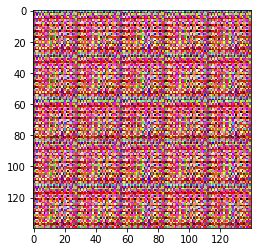

Epoch 1/10 Step 300... Discriminator Loss: 6.9290... Generator Loss: 0.0027
Epoch 1/10 Step 400... Discriminator Loss: 6.0092... Generator Loss: 0.0070


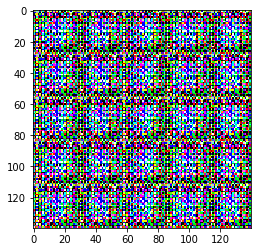

Epoch 2/10 Step 500... Discriminator Loss: 4.3124... Generator Loss: 0.0391
Epoch 2/10 Step 600... Discriminator Loss: 3.0668... Generator Loss: 0.1334


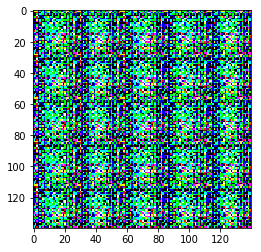

Epoch 2/10 Step 700... Discriminator Loss: 2.4305... Generator Loss: 0.3045
Epoch 2/10 Step 800... Discriminator Loss: 1.6624... Generator Loss: 0.5930


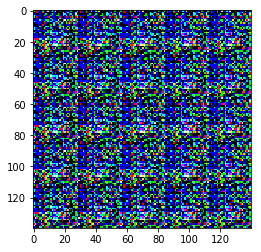

Epoch 2/10 Step 900... Discriminator Loss: 2.0592... Generator Loss: 0.3783
Epoch 3/10 Step 1000... Discriminator Loss: 1.9291... Generator Loss: 0.5847


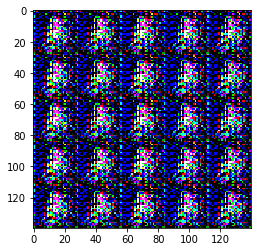

Epoch 3/10 Step 1100... Discriminator Loss: 2.1340... Generator Loss: 0.5147
Epoch 3/10 Step 1200... Discriminator Loss: 1.4743... Generator Loss: 0.7360


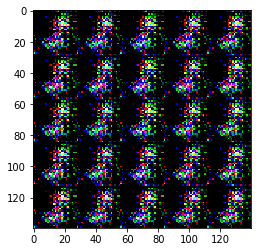

Epoch 3/10 Step 1300... Discriminator Loss: 1.2861... Generator Loss: 0.9082
Epoch 3/10 Step 1400... Discriminator Loss: 2.9816... Generator Loss: 0.1986


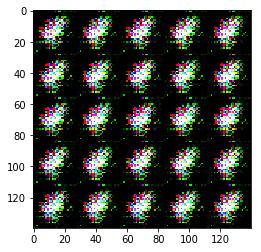

Epoch 4/10 Step 1500... Discriminator Loss: 2.0889... Generator Loss: 0.6543
Epoch 4/10 Step 1600... Discriminator Loss: 1.8250... Generator Loss: 0.7756


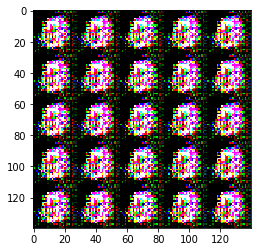

Epoch 4/10 Step 1700... Discriminator Loss: 1.2507... Generator Loss: 1.0295
Epoch 4/10 Step 1800... Discriminator Loss: 1.2070... Generator Loss: 1.0500


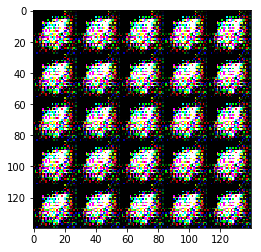

Epoch 5/10 Step 1900... Discriminator Loss: 1.6761... Generator Loss: 0.6436
Epoch 5/10 Step 2000... Discriminator Loss: 1.0385... Generator Loss: 1.2626


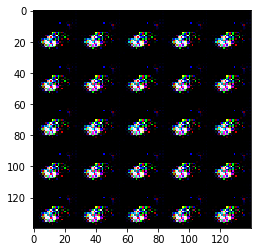

Epoch 5/10 Step 2100... Discriminator Loss: 1.7953... Generator Loss: 0.6747
Epoch 5/10 Step 2200... Discriminator Loss: 1.7779... Generator Loss: 0.7125


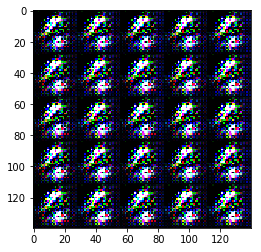

Epoch 5/10 Step 2300... Discriminator Loss: 1.4769... Generator Loss: 0.8044
Epoch 6/10 Step 2400... Discriminator Loss: 1.0001... Generator Loss: 1.3173


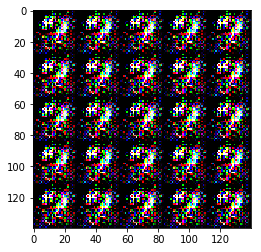

Epoch 6/10 Step 2500... Discriminator Loss: 1.3590... Generator Loss: 0.7911
Epoch 6/10 Step 2600... Discriminator Loss: 1.5672... Generator Loss: 0.7337


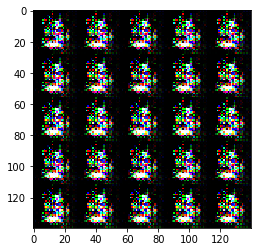

Epoch 6/10 Step 2700... Discriminator Loss: 1.3721... Generator Loss: 0.8525
Epoch 6/10 Step 2800... Discriminator Loss: 1.4138... Generator Loss: 0.7867


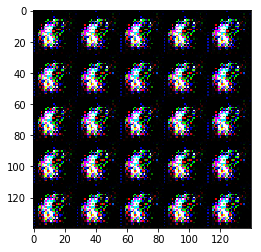

Epoch 7/10 Step 2900... Discriminator Loss: 1.8595... Generator Loss: 0.7347
Epoch 7/10 Step 3000... Discriminator Loss: 1.5820... Generator Loss: 0.8948


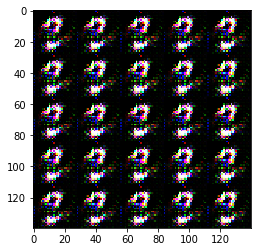

Epoch 7/10 Step 3100... Discriminator Loss: 2.0499... Generator Loss: 0.5384
Epoch 7/10 Step 3200... Discriminator Loss: 1.9901... Generator Loss: 0.6468


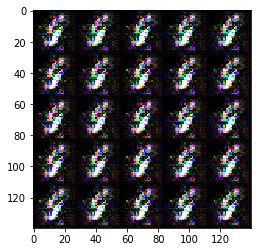

Epoch 8/10 Step 3300... Discriminator Loss: 2.0252... Generator Loss: 0.5543
Epoch 8/10 Step 3400... Discriminator Loss: 2.2309... Generator Loss: 0.4792


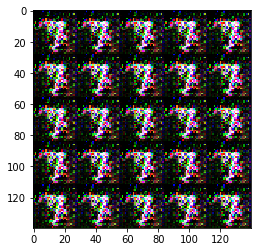

Epoch 8/10 Step 3500... Discriminator Loss: 1.9470... Generator Loss: 0.6503
Epoch 8/10 Step 3600... Discriminator Loss: 1.5901... Generator Loss: 0.7509


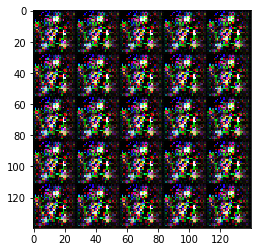

Epoch 8/10 Step 3700... Discriminator Loss: 1.3024... Generator Loss: 0.8844
Epoch 9/10 Step 3800... Discriminator Loss: 2.2048... Generator Loss: 0.4440


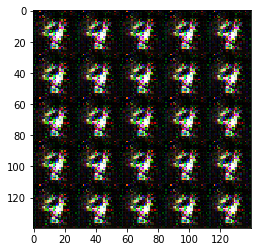

Epoch 9/10 Step 3900... Discriminator Loss: 2.4945... Generator Loss: 0.5231
Epoch 9/10 Step 4000... Discriminator Loss: 2.0337... Generator Loss: 0.4296


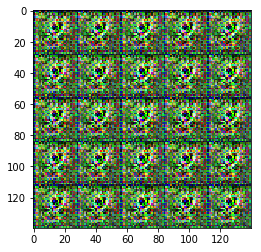

Epoch 9/10 Step 4100... Discriminator Loss: 2.1523... Generator Loss: 0.4058
Epoch 9/10 Step 4200... Discriminator Loss: 2.1001... Generator Loss: 0.4229


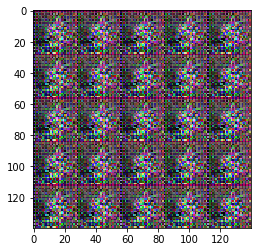

Epoch 10/10 Step 4300... Discriminator Loss: 3.0317... Generator Loss: 0.4646
Epoch 10/10 Step 4400... Discriminator Loss: 2.4170... Generator Loss: 0.5195


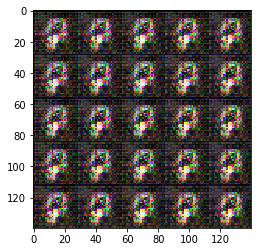

Epoch 10/10 Step 4500... Discriminator Loss: 2.1158... Generator Loss: 0.6622
Epoch 10/10 Step 4600... Discriminator Loss: 2.2461... Generator Loss: 0.4751


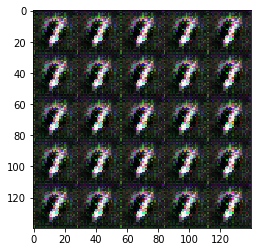

In [12]:
batch_size = 128
z_dim = 100
learning_rate = 0.0055
beta1 = 0.5
epochs = 10

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
在 CelebA 上运行你的 GANs 模型。在一般的GPU上运行每次迭代大约需要 20 分钟。你可以运行整个迭代，或者当 GANs 开始产生真实人脸图像时停止它。

Epoch 1/20 Step 100... Discriminator Loss: 7.4441... Generator Loss: 0.0011
Epoch 1/20 Step 200... Discriminator Loss: 8.1764... Generator Loss: 0.0007


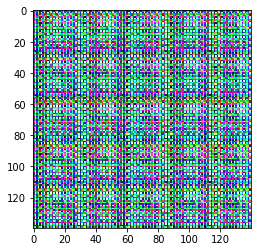

Epoch 1/20 Step 300... Discriminator Loss: 7.2807... Generator Loss: 0.0019
Epoch 1/20 Step 400... Discriminator Loss: 5.9387... Generator Loss: 0.0083


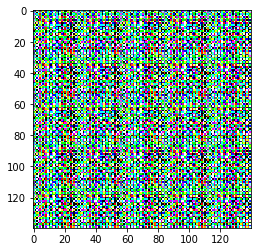

Epoch 1/20 Step 500... Discriminator Loss: 4.4174... Generator Loss: 0.0459
Epoch 1/20 Step 600... Discriminator Loss: 3.6140... Generator Loss: 0.1447


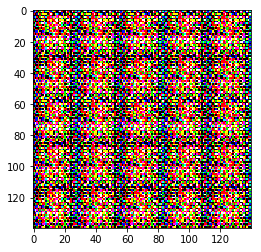

Epoch 1/20 Step 700... Discriminator Loss: 3.3485... Generator Loss: 0.1831
Epoch 1/20 Step 800... Discriminator Loss: 1.9605... Generator Loss: 0.6520


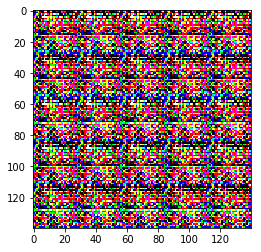

Epoch 1/20 Step 900... Discriminator Loss: 1.5054... Generator Loss: 1.0186
Epoch 1/20 Step 1000... Discriminator Loss: 1.5692... Generator Loss: 0.8186


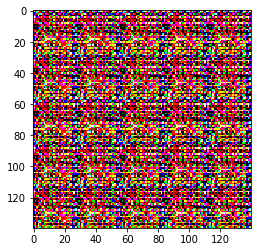

Epoch 1/20 Step 1100... Discriminator Loss: 2.0936... Generator Loss: 0.5274
Epoch 1/20 Step 1200... Discriminator Loss: 1.8732... Generator Loss: 0.6021


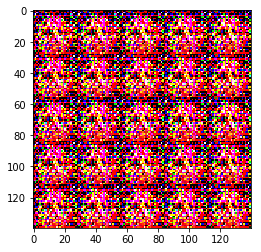

Epoch 1/20 Step 1300... Discriminator Loss: 1.9531... Generator Loss: 0.7402
Epoch 1/20 Step 1400... Discriminator Loss: 1.4128... Generator Loss: 1.1028


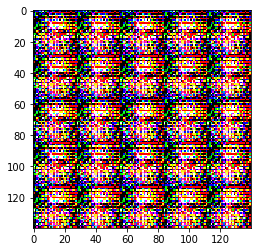

Epoch 1/20 Step 1500... Discriminator Loss: 1.3805... Generator Loss: 1.0174
Epoch 2/20 Step 1600... Discriminator Loss: 0.9942... Generator Loss: 1.4599


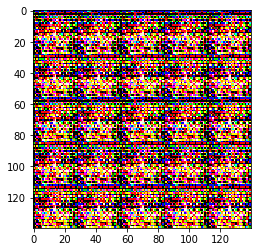

Epoch 2/20 Step 1700... Discriminator Loss: 1.2220... Generator Loss: 0.9962
Epoch 2/20 Step 1800... Discriminator Loss: 0.9991... Generator Loss: 1.2422


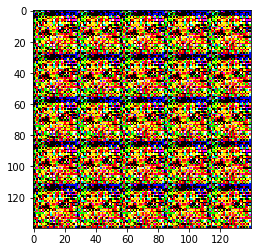

Epoch 2/20 Step 1900... Discriminator Loss: 1.2097... Generator Loss: 0.9445
Epoch 2/20 Step 2000... Discriminator Loss: 1.0899... Generator Loss: 1.1857


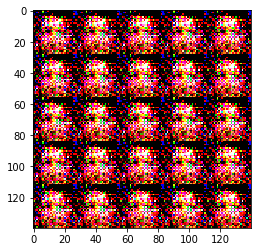

Epoch 2/20 Step 2100... Discriminator Loss: 2.3657... Generator Loss: 0.6551
Epoch 2/20 Step 2200... Discriminator Loss: 1.7024... Generator Loss: 0.8604


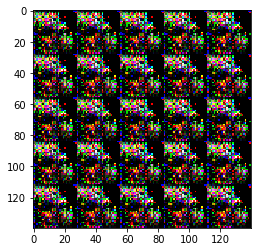

Epoch 2/20 Step 2300... Discriminator Loss: 0.9726... Generator Loss: 1.2660
Epoch 2/20 Step 2400... Discriminator Loss: 1.4569... Generator Loss: 0.8362


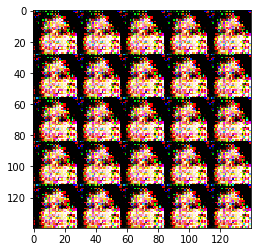

Epoch 2/20 Step 2500... Discriminator Loss: 2.0906... Generator Loss: 0.8471
Epoch 2/20 Step 2600... Discriminator Loss: 1.6280... Generator Loss: 0.8754


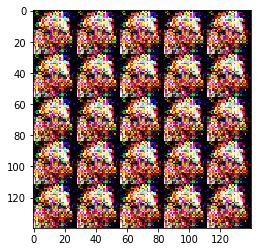

Epoch 2/20 Step 2700... Discriminator Loss: 2.4545... Generator Loss: 0.5040
Epoch 2/20 Step 2800... Discriminator Loss: 1.6649... Generator Loss: 0.7827


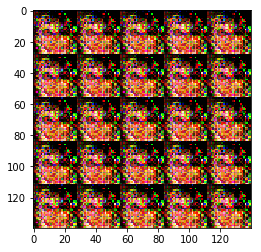

Epoch 2/20 Step 2900... Discriminator Loss: 1.4785... Generator Loss: 0.9565
Epoch 2/20 Step 3000... Discriminator Loss: 1.6599... Generator Loss: 0.7461


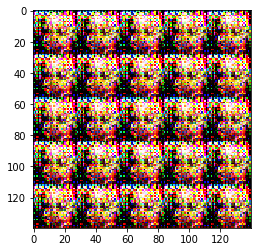

Epoch 2/20 Step 3100... Discriminator Loss: 2.1704... Generator Loss: 0.4406
Epoch 3/20 Step 3200... Discriminator Loss: 1.6443... Generator Loss: 0.7415


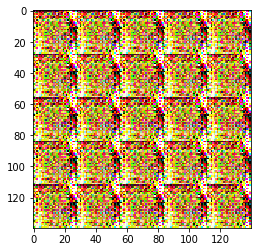

Epoch 3/20 Step 3300... Discriminator Loss: 1.6361... Generator Loss: 0.7886
Epoch 3/20 Step 3400... Discriminator Loss: 1.9938... Generator Loss: 0.5435


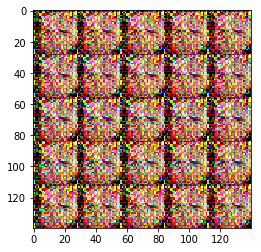

Epoch 3/20 Step 3500... Discriminator Loss: 3.2152... Generator Loss: 0.3034
Epoch 3/20 Step 3600... Discriminator Loss: 2.2793... Generator Loss: 0.7450


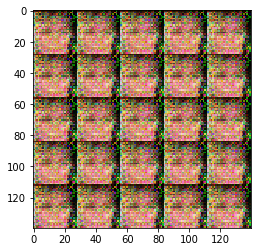

Epoch 3/20 Step 3700... Discriminator Loss: 1.9269... Generator Loss: 0.5831
Epoch 3/20 Step 3800... Discriminator Loss: 1.8637... Generator Loss: 0.6276


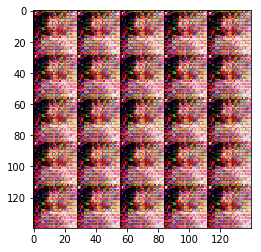

Epoch 3/20 Step 3900... Discriminator Loss: 2.2771... Generator Loss: 0.6053
Epoch 3/20 Step 4000... Discriminator Loss: 3.2112... Generator Loss: 0.2805


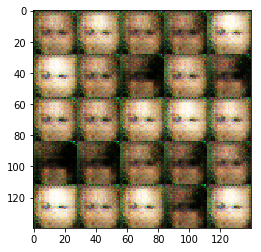

Epoch 3/20 Step 4100... Discriminator Loss: 3.2370... Generator Loss: 0.3177
Epoch 3/20 Step 4200... Discriminator Loss: 2.8550... Generator Loss: 0.3484


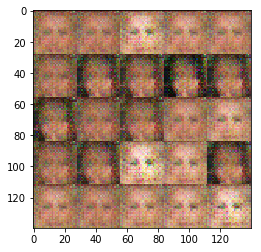

Epoch 3/20 Step 4300... Discriminator Loss: 2.6753... Generator Loss: 0.3899
Epoch 3/20 Step 4400... Discriminator Loss: 2.2812... Generator Loss: 0.4437


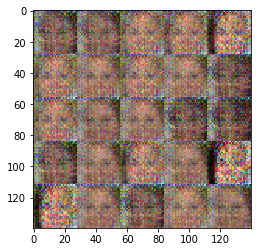

Epoch 3/20 Step 4500... Discriminator Loss: 2.5036... Generator Loss: 0.4359
Epoch 3/20 Step 4600... Discriminator Loss: 2.0048... Generator Loss: 0.6020


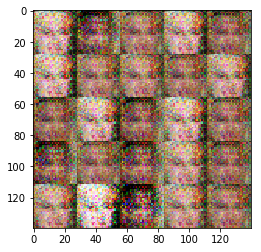

Epoch 3/20 Step 4700... Discriminator Loss: 2.1355... Generator Loss: 0.5196
Epoch 4/20 Step 4800... Discriminator Loss: 1.8931... Generator Loss: 0.6109


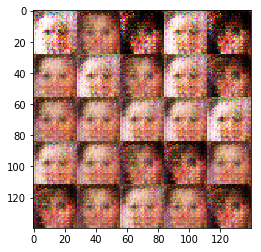

Epoch 4/20 Step 4900... Discriminator Loss: 1.7581... Generator Loss: 0.6400
Epoch 4/20 Step 5000... Discriminator Loss: 1.9633... Generator Loss: 0.5009


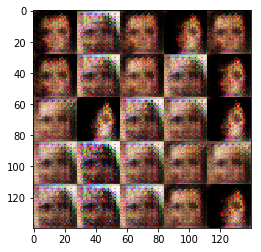

Epoch 4/20 Step 5100... Discriminator Loss: 1.7205... Generator Loss: 0.7212
Epoch 4/20 Step 5200... Discriminator Loss: 1.6936... Generator Loss: 0.6544


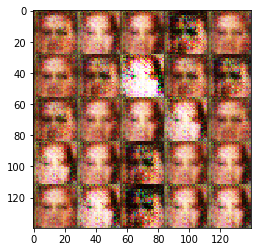

Epoch 4/20 Step 5300... Discriminator Loss: 1.6205... Generator Loss: 0.6989
Epoch 4/20 Step 5400... Discriminator Loss: 1.6693... Generator Loss: 0.6423


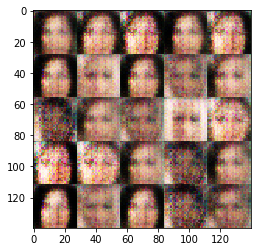

Epoch 4/20 Step 5500... Discriminator Loss: 1.7321... Generator Loss: 0.6324
Epoch 4/20 Step 5600... Discriminator Loss: 1.7134... Generator Loss: 0.6380


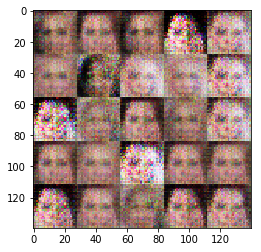

Epoch 4/20 Step 5700... Discriminator Loss: 1.6733... Generator Loss: 0.6451
Epoch 4/20 Step 5800... Discriminator Loss: 1.7250... Generator Loss: 0.6188


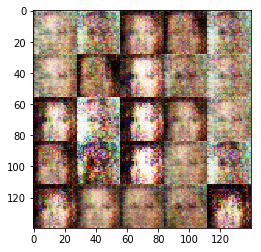

Epoch 4/20 Step 5900... Discriminator Loss: 1.6800... Generator Loss: 0.6341
Epoch 4/20 Step 6000... Discriminator Loss: 1.6685... Generator Loss: 0.6777


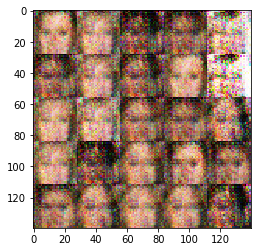

Epoch 4/20 Step 6100... Discriminator Loss: 1.6912... Generator Loss: 0.6479
Epoch 4/20 Step 6200... Discriminator Loss: 1.6588... Generator Loss: 0.6748


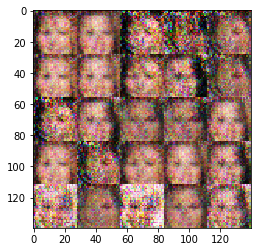

Epoch 4/20 Step 6300... Discriminator Loss: 1.6052... Generator Loss: 0.6950
Epoch 5/20 Step 6400... Discriminator Loss: 1.6050... Generator Loss: 0.7010


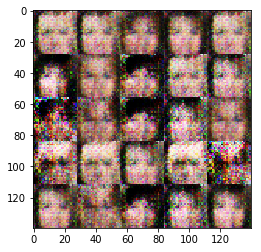

Epoch 5/20 Step 6500... Discriminator Loss: 1.5645... Generator Loss: 0.6733
Epoch 5/20 Step 6600... Discriminator Loss: 1.5203... Generator Loss: 0.7031


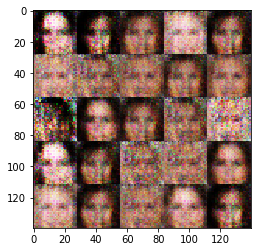

Epoch 5/20 Step 6700... Discriminator Loss: 1.5575... Generator Loss: 0.7124
Epoch 5/20 Step 6800... Discriminator Loss: 1.5284... Generator Loss: 0.7385


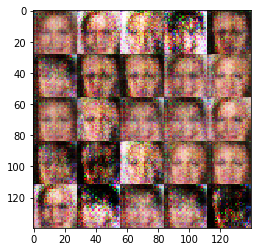

Epoch 5/20 Step 6900... Discriminator Loss: 1.5343... Generator Loss: 0.7338
Epoch 5/20 Step 7000... Discriminator Loss: 1.5242... Generator Loss: 0.7086


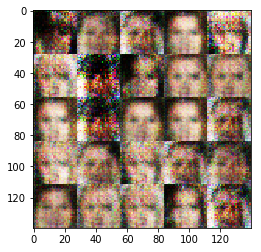

Epoch 5/20 Step 7100... Discriminator Loss: 1.5554... Generator Loss: 0.7277
Epoch 5/20 Step 7200... Discriminator Loss: 1.5001... Generator Loss: 0.7307


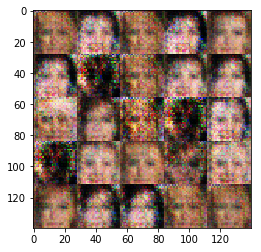

Epoch 5/20 Step 7300... Discriminator Loss: 1.5216... Generator Loss: 0.7050
Epoch 5/20 Step 7400... Discriminator Loss: 1.5292... Generator Loss: 0.6992


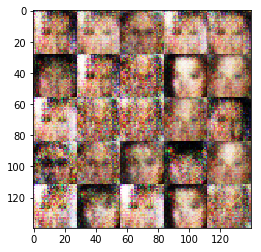

Epoch 5/20 Step 7500... Discriminator Loss: 1.5337... Generator Loss: 0.7300
Epoch 5/20 Step 7600... Discriminator Loss: 1.5305... Generator Loss: 0.7203


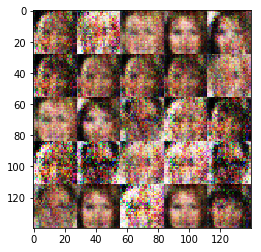

Epoch 5/20 Step 7700... Discriminator Loss: 1.5296... Generator Loss: 0.7442
Epoch 5/20 Step 7800... Discriminator Loss: 1.4686... Generator Loss: 0.7523


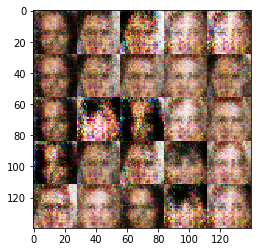

Epoch 5/20 Step 7900... Discriminator Loss: 1.4757... Generator Loss: 0.7542
Epoch 6/20 Step 8000... Discriminator Loss: 1.4435... Generator Loss: 0.7594


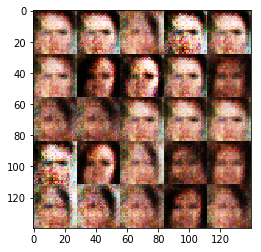

Epoch 6/20 Step 8100... Discriminator Loss: 1.4341... Generator Loss: 0.7965
Epoch 6/20 Step 8200... Discriminator Loss: 1.4311... Generator Loss: 0.7983


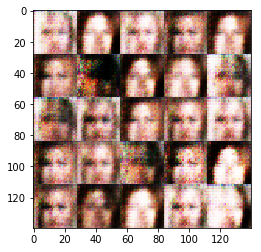

Epoch 6/20 Step 8300... Discriminator Loss: 1.3978... Generator Loss: 0.8138
Epoch 6/20 Step 8400... Discriminator Loss: 1.4046... Generator Loss: 0.8088


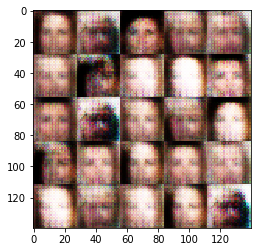

Epoch 6/20 Step 8500... Discriminator Loss: 1.4153... Generator Loss: 0.7686
Epoch 6/20 Step 8600... Discriminator Loss: 1.4256... Generator Loss: 0.7598


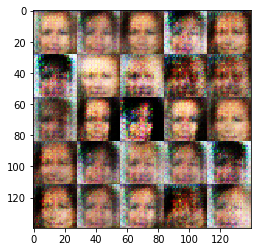

Epoch 6/20 Step 8700... Discriminator Loss: 1.4413... Generator Loss: 0.7729
Epoch 6/20 Step 8800... Discriminator Loss: 1.4485... Generator Loss: 0.7581


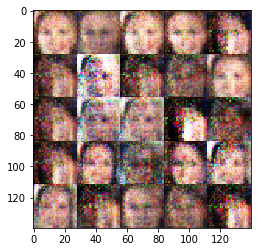

Epoch 6/20 Step 8900... Discriminator Loss: 1.4543... Generator Loss: 0.7666
Epoch 6/20 Step 9000... Discriminator Loss: 1.4740... Generator Loss: 0.7497


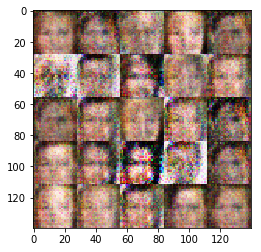

Epoch 6/20 Step 9100... Discriminator Loss: 1.4585... Generator Loss: 0.7266
Epoch 6/20 Step 9200... Discriminator Loss: 1.4655... Generator Loss: 0.7574


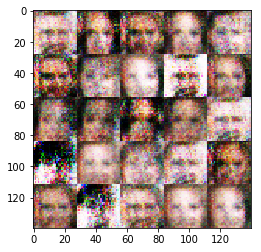

Epoch 6/20 Step 9300... Discriminator Loss: 1.4862... Generator Loss: 0.7443
Epoch 6/20 Step 9400... Discriminator Loss: 1.4760... Generator Loss: 0.7475


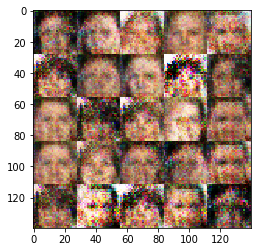

Epoch 7/20 Step 9500... Discriminator Loss: 1.4713... Generator Loss: 0.7373
Epoch 7/20 Step 9600... Discriminator Loss: 1.4753... Generator Loss: 0.7277


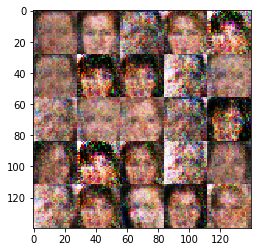

Epoch 7/20 Step 9700... Discriminator Loss: 1.4719... Generator Loss: 0.7439
Epoch 7/20 Step 9800... Discriminator Loss: 1.4829... Generator Loss: 0.7453


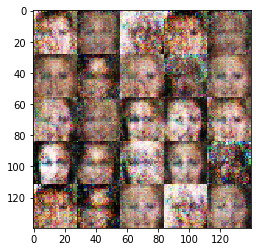

Epoch 7/20 Step 9900... Discriminator Loss: 1.4737... Generator Loss: 0.7475
Epoch 7/20 Step 10000... Discriminator Loss: 1.4558... Generator Loss: 0.7650


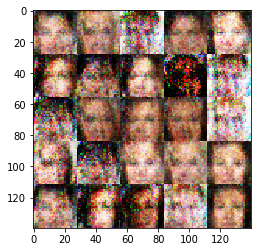

Epoch 7/20 Step 10100... Discriminator Loss: 1.4688... Generator Loss: 0.7343
Epoch 7/20 Step 10200... Discriminator Loss: 1.4700... Generator Loss: 0.7467


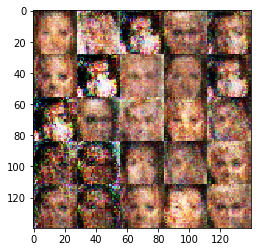

Epoch 7/20 Step 10300... Discriminator Loss: 1.4593... Generator Loss: 0.7505
Epoch 7/20 Step 10400... Discriminator Loss: 1.4779... Generator Loss: 0.7357


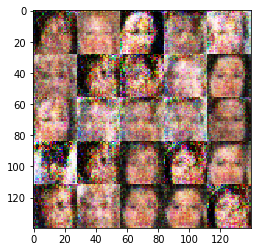

Epoch 7/20 Step 10500... Discriminator Loss: 1.4675... Generator Loss: 0.7583
Epoch 7/20 Step 10600... Discriminator Loss: 1.4585... Generator Loss: 0.7473


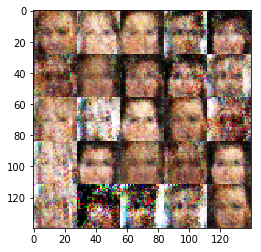

Epoch 7/20 Step 10700... Discriminator Loss: 1.4694... Generator Loss: 0.7370
Epoch 7/20 Step 10800... Discriminator Loss: 1.4706... Generator Loss: 0.7462


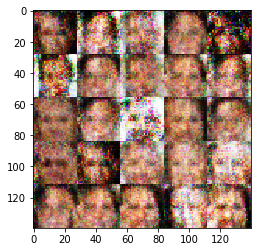

Epoch 7/20 Step 10900... Discriminator Loss: 1.4534... Generator Loss: 0.7595
Epoch 7/20 Step 11000... Discriminator Loss: 1.4531... Generator Loss: 0.7425


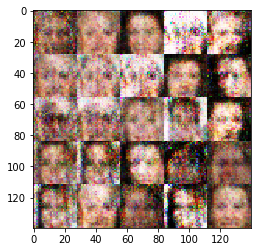

Epoch 8/20 Step 11100... Discriminator Loss: 1.4496... Generator Loss: 0.7459
Epoch 8/20 Step 11200... Discriminator Loss: 1.4614... Generator Loss: 0.7517


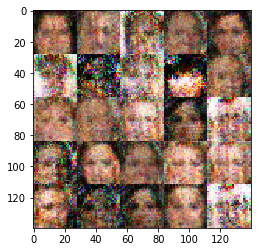

Epoch 8/20 Step 11300... Discriminator Loss: 1.4605... Generator Loss: 0.7485
Epoch 8/20 Step 11400... Discriminator Loss: 1.4504... Generator Loss: 0.7597


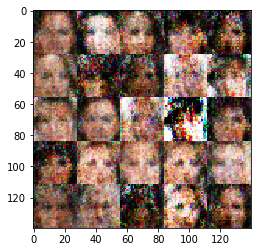

Epoch 8/20 Step 11500... Discriminator Loss: 1.4452... Generator Loss: 0.7479
Epoch 8/20 Step 11600... Discriminator Loss: 1.4570... Generator Loss: 0.7496


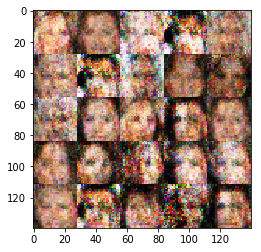

Epoch 8/20 Step 11700... Discriminator Loss: 1.4516... Generator Loss: 0.7568
Epoch 8/20 Step 11800... Discriminator Loss: 1.4445... Generator Loss: 0.7516


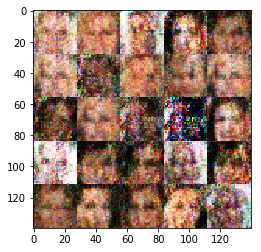

Epoch 8/20 Step 11900... Discriminator Loss: 1.4514... Generator Loss: 0.7513
Epoch 8/20 Step 12000... Discriminator Loss: 1.4477... Generator Loss: 0.7618


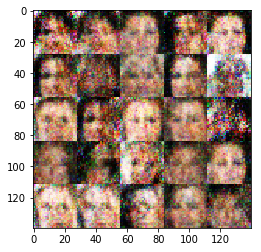

Epoch 8/20 Step 12100... Discriminator Loss: 1.4468... Generator Loss: 0.7521
Epoch 8/20 Step 12200... Discriminator Loss: 1.4440... Generator Loss: 0.7668


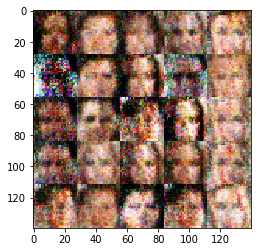

Epoch 8/20 Step 12300... Discriminator Loss: 1.4381... Generator Loss: 0.7639
Epoch 8/20 Step 12400... Discriminator Loss: 1.4502... Generator Loss: 0.7567


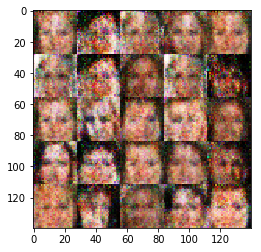

Epoch 8/20 Step 12500... Discriminator Loss: 1.4402... Generator Loss: 0.7618
Epoch 8/20 Step 12600... Discriminator Loss: 1.4433... Generator Loss: 0.7543


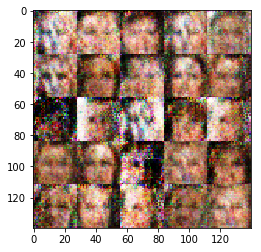

Epoch 9/20 Step 12700... Discriminator Loss: 1.4507... Generator Loss: 0.7562
Epoch 9/20 Step 12800... Discriminator Loss: 1.4387... Generator Loss: 0.7486


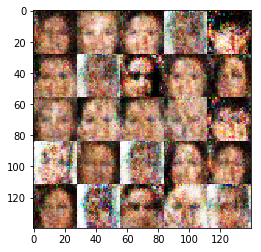

Epoch 9/20 Step 12900... Discriminator Loss: 1.4382... Generator Loss: 0.7633
Epoch 9/20 Step 13000... Discriminator Loss: 1.4368... Generator Loss: 0.7571


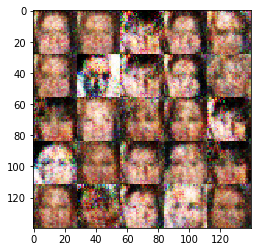

Epoch 9/20 Step 13100... Discriminator Loss: 1.4368... Generator Loss: 0.7554
Epoch 9/20 Step 13200... Discriminator Loss: 1.4343... Generator Loss: 0.7682


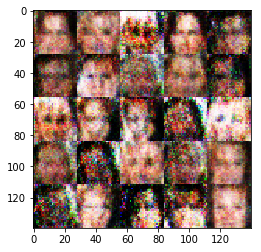

Epoch 9/20 Step 13300... Discriminator Loss: 1.4332... Generator Loss: 0.7744
Epoch 9/20 Step 13400... Discriminator Loss: 1.4254... Generator Loss: 0.7699


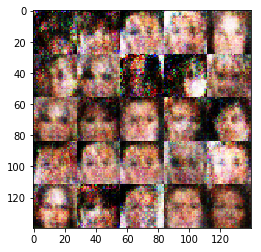

Epoch 9/20 Step 13500... Discriminator Loss: 1.4333... Generator Loss: 0.7675
Epoch 9/20 Step 13600... Discriminator Loss: 1.4248... Generator Loss: 0.7771


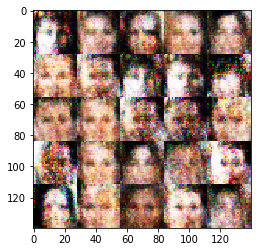

Epoch 9/20 Step 13700... Discriminator Loss: 1.4187... Generator Loss: 0.7781
Epoch 9/20 Step 13800... Discriminator Loss: 1.4202... Generator Loss: 0.7512


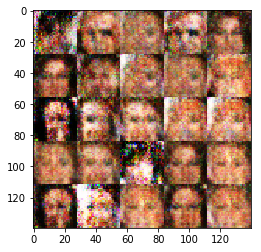

Epoch 9/20 Step 13900... Discriminator Loss: 1.4209... Generator Loss: 0.7691
Epoch 9/20 Step 14000... Discriminator Loss: 1.4149... Generator Loss: 0.7728


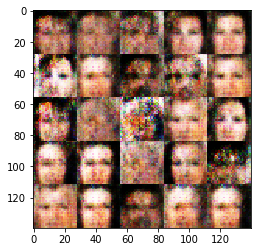

Epoch 9/20 Step 14100... Discriminator Loss: 1.3960... Generator Loss: 0.7952
Epoch 9/20 Step 14200... Discriminator Loss: 1.3519... Generator Loss: 0.8461


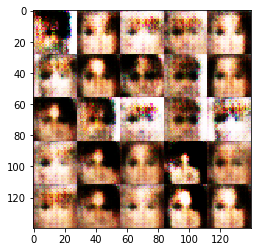

Epoch 10/20 Step 14300... Discriminator Loss: 1.4029... Generator Loss: 0.7740
Epoch 10/20 Step 14400... Discriminator Loss: 1.3708... Generator Loss: 0.8387


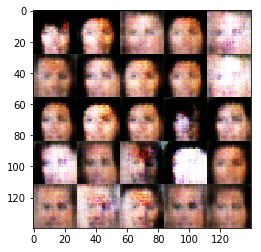

Epoch 10/20 Step 14500... Discriminator Loss: 1.3788... Generator Loss: 0.7567
Epoch 10/20 Step 14600... Discriminator Loss: 1.3707... Generator Loss: 0.7895


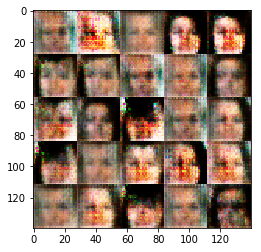

Epoch 10/20 Step 14700... Discriminator Loss: 1.3964... Generator Loss: 0.7931
Epoch 10/20 Step 14800... Discriminator Loss: 1.3674... Generator Loss: 0.8226


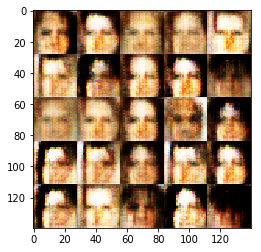

Epoch 10/20 Step 14900... Discriminator Loss: 1.3838... Generator Loss: 0.7835
Epoch 10/20 Step 15000... Discriminator Loss: 1.3951... Generator Loss: 0.7734


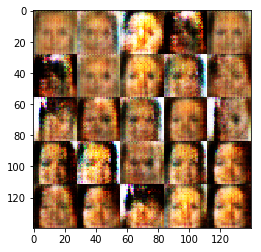

Epoch 10/20 Step 15100... Discriminator Loss: 1.3992... Generator Loss: 0.7867
Epoch 10/20 Step 15200... Discriminator Loss: 1.3928... Generator Loss: 0.7825


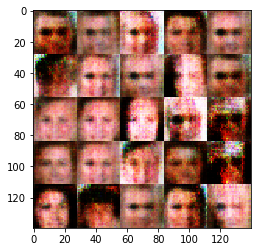

Epoch 10/20 Step 15300... Discriminator Loss: 1.3902... Generator Loss: 0.7806
Epoch 10/20 Step 15400... Discriminator Loss: 1.3793... Generator Loss: 0.8145


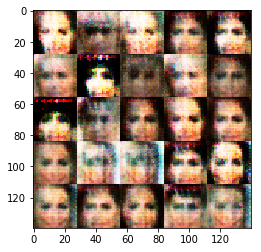

Epoch 10/20 Step 15500... Discriminator Loss: 1.3883... Generator Loss: 0.7924
Epoch 10/20 Step 15600... Discriminator Loss: 1.3961... Generator Loss: 0.8021


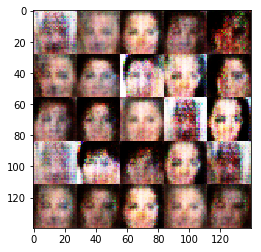

Epoch 10/20 Step 15700... Discriminator Loss: 1.3882... Generator Loss: 0.7956
Epoch 10/20 Step 15800... Discriminator Loss: 1.3809... Generator Loss: 0.8102


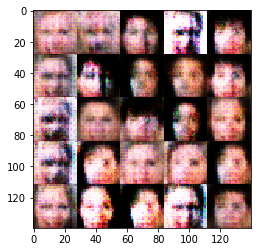

Epoch 11/20 Step 15900... Discriminator Loss: 1.3882... Generator Loss: 0.7954
Epoch 11/20 Step 16000... Discriminator Loss: 1.3835... Generator Loss: 0.8022


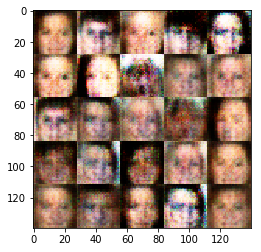

Epoch 11/20 Step 16100... Discriminator Loss: 1.3951... Generator Loss: 0.7747
Epoch 11/20 Step 16200... Discriminator Loss: 1.3964... Generator Loss: 0.7754


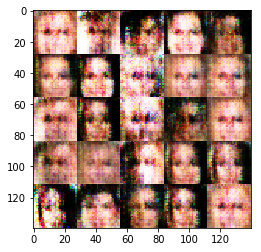

Epoch 11/20 Step 16300... Discriminator Loss: 1.3773... Generator Loss: 0.8068
Epoch 11/20 Step 16400... Discriminator Loss: 1.3674... Generator Loss: 0.8412


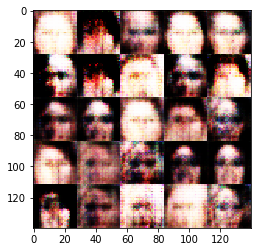

Epoch 11/20 Step 16500... Discriminator Loss: 1.3859... Generator Loss: 0.7657
Epoch 11/20 Step 16600... Discriminator Loss: 1.3867... Generator Loss: 0.8019


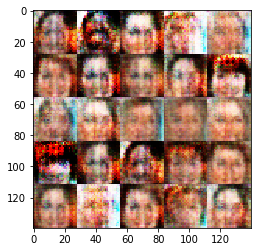

Epoch 11/20 Step 16700... Discriminator Loss: 1.3910... Generator Loss: 0.7892
Epoch 11/20 Step 16800... Discriminator Loss: 1.3765... Generator Loss: 0.8142


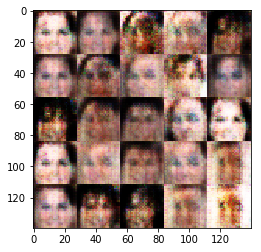

Epoch 11/20 Step 16900... Discriminator Loss: 1.3845... Generator Loss: 0.7845
Epoch 11/20 Step 17000... Discriminator Loss: 1.3850... Generator Loss: 0.7810


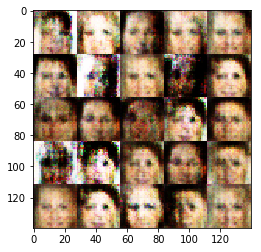

Epoch 11/20 Step 17100... Discriminator Loss: 1.3823... Generator Loss: 0.7844
Epoch 11/20 Step 17200... Discriminator Loss: 1.3896... Generator Loss: 0.7917


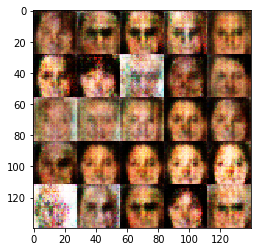

Epoch 11/20 Step 17300... Discriminator Loss: 1.3976... Generator Loss: 0.7944
Epoch 11/20 Step 17400... Discriminator Loss: 1.3929... Generator Loss: 0.7765


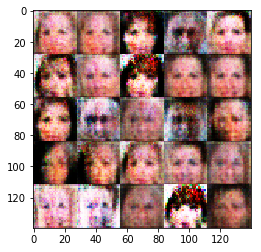

Epoch 12/20 Step 17500... Discriminator Loss: 1.3819... Generator Loss: 0.7884
Epoch 12/20 Step 17600... Discriminator Loss: 1.3940... Generator Loss: 0.7811


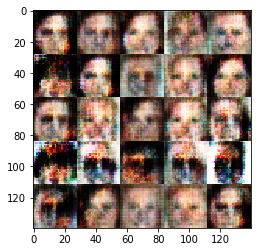

Epoch 12/20 Step 17700... Discriminator Loss: 1.3880... Generator Loss: 0.8052
Epoch 12/20 Step 17800... Discriminator Loss: 1.3913... Generator Loss: 0.8008


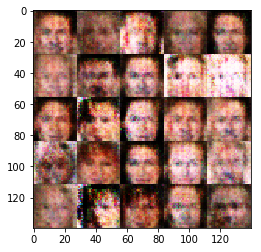

Epoch 12/20 Step 17900... Discriminator Loss: 1.3967... Generator Loss: 0.7830
Epoch 12/20 Step 18000... Discriminator Loss: 1.3946... Generator Loss: 0.7731


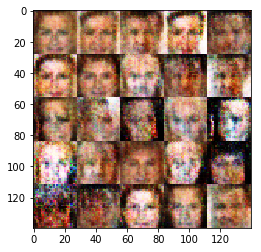

Epoch 12/20 Step 18100... Discriminator Loss: 1.3941... Generator Loss: 0.7738
Epoch 12/20 Step 18200... Discriminator Loss: 1.4000... Generator Loss: 0.7799


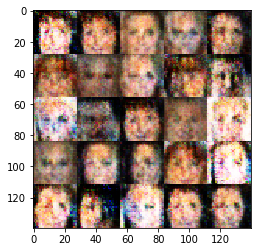

Epoch 12/20 Step 18300... Discriminator Loss: 1.3974... Generator Loss: 0.7763
Epoch 12/20 Step 18400... Discriminator Loss: 1.3944... Generator Loss: 0.7895


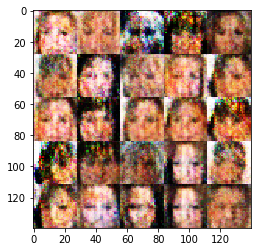

Epoch 12/20 Step 18500... Discriminator Loss: 1.3952... Generator Loss: 0.7732
Epoch 12/20 Step 18600... Discriminator Loss: 1.3916... Generator Loss: 0.8021


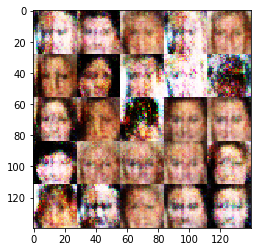

Epoch 12/20 Step 18700... Discriminator Loss: 1.3940... Generator Loss: 0.7822
Epoch 12/20 Step 18800... Discriminator Loss: 1.3911... Generator Loss: 0.7945


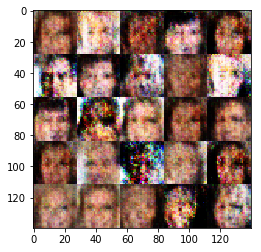

Epoch 12/20 Step 18900... Discriminator Loss: 1.3878... Generator Loss: 0.7840
Epoch 13/20 Step 19000... Discriminator Loss: 1.3921... Generator Loss: 0.7715


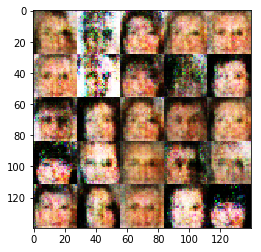

Epoch 13/20 Step 19100... Discriminator Loss: 1.3975... Generator Loss: 0.7882
Epoch 13/20 Step 19200... Discriminator Loss: 1.3995... Generator Loss: 0.7753


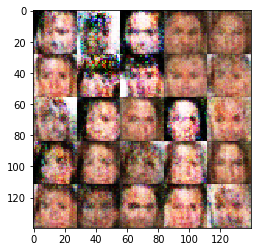

Epoch 13/20 Step 19300... Discriminator Loss: 1.3962... Generator Loss: 0.7788
Epoch 13/20 Step 19400... Discriminator Loss: 1.4001... Generator Loss: 0.7696


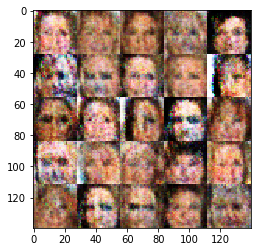

Epoch 13/20 Step 19500... Discriminator Loss: 1.4005... Generator Loss: 0.7870
Epoch 13/20 Step 19600... Discriminator Loss: 1.3956... Generator Loss: 0.8018


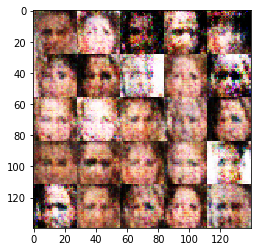

Epoch 13/20 Step 19700... Discriminator Loss: 1.3944... Generator Loss: 0.7864
Epoch 13/20 Step 19800... Discriminator Loss: 1.3951... Generator Loss: 0.7801


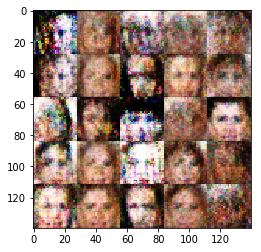

Epoch 13/20 Step 19900... Discriminator Loss: 1.3937... Generator Loss: 0.7928
Epoch 13/20 Step 20000... Discriminator Loss: 1.3996... Generator Loss: 0.7871


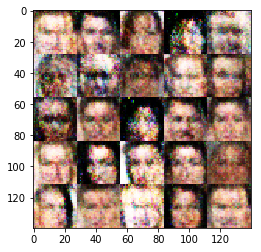

Epoch 13/20 Step 20100... Discriminator Loss: 1.3958... Generator Loss: 0.7851
Epoch 13/20 Step 20200... Discriminator Loss: 1.3981... Generator Loss: 0.7776


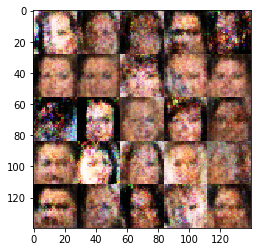

Epoch 13/20 Step 20300... Discriminator Loss: 1.3932... Generator Loss: 0.7963
Epoch 13/20 Step 20400... Discriminator Loss: 1.3949... Generator Loss: 0.7848


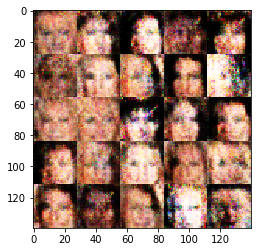

Epoch 13/20 Step 20500... Discriminator Loss: 1.3973... Generator Loss: 0.7827
Epoch 14/20 Step 20600... Discriminator Loss: 1.3951... Generator Loss: 0.7862


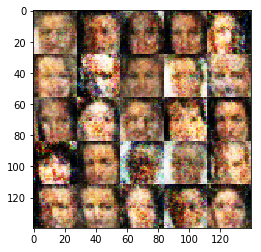

Epoch 14/20 Step 20700... Discriminator Loss: 1.3984... Generator Loss: 0.7886
Epoch 14/20 Step 20800... Discriminator Loss: 1.3992... Generator Loss: 0.7933


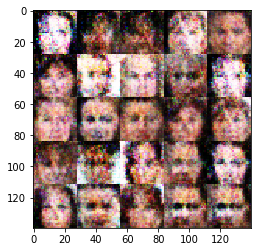

Epoch 14/20 Step 20900... Discriminator Loss: 1.3969... Generator Loss: 0.7695
Epoch 14/20 Step 21000... Discriminator Loss: 1.4046... Generator Loss: 0.7700


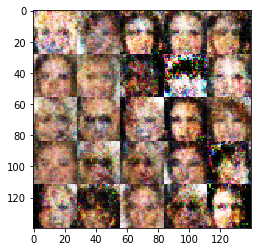

Epoch 14/20 Step 21100... Discriminator Loss: 1.3986... Generator Loss: 0.7827
Epoch 14/20 Step 21200... Discriminator Loss: 1.3987... Generator Loss: 0.7796


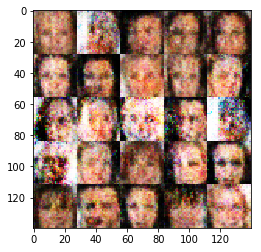

Epoch 14/20 Step 21300... Discriminator Loss: 1.4042... Generator Loss: 0.7762
Epoch 14/20 Step 21400... Discriminator Loss: 1.4002... Generator Loss: 0.7814


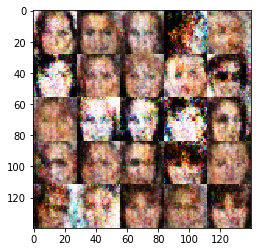

Epoch 14/20 Step 21500... Discriminator Loss: 1.4007... Generator Loss: 0.7831
Epoch 14/20 Step 21600... Discriminator Loss: 1.3958... Generator Loss: 0.7889


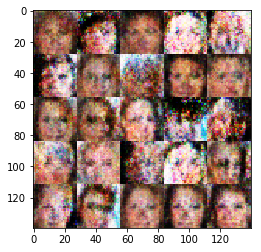

Epoch 14/20 Step 21700... Discriminator Loss: 1.3953... Generator Loss: 0.7998
Epoch 14/20 Step 21800... Discriminator Loss: 1.3968... Generator Loss: 0.7882


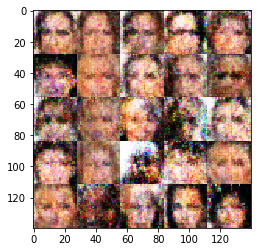

Epoch 14/20 Step 21900... Discriminator Loss: 1.3997... Generator Loss: 0.7845
Epoch 14/20 Step 22000... Discriminator Loss: 1.3968... Generator Loss: 0.7846


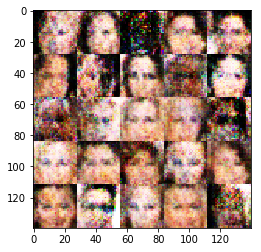

Epoch 14/20 Step 22100... Discriminator Loss: 1.4020... Generator Loss: 0.7780
Epoch 15/20 Step 22200... Discriminator Loss: 1.4012... Generator Loss: 0.7829


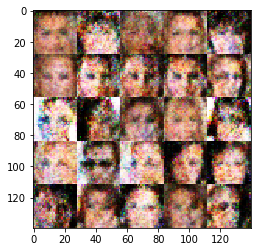

Epoch 15/20 Step 22300... Discriminator Loss: 1.3999... Generator Loss: 0.7864
Epoch 15/20 Step 22400... Discriminator Loss: 1.3968... Generator Loss: 0.7821


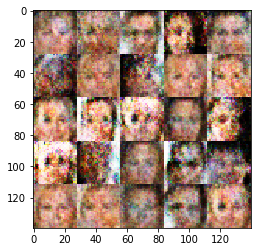

Epoch 15/20 Step 22500... Discriminator Loss: 1.4024... Generator Loss: 0.7863
Epoch 15/20 Step 22600... Discriminator Loss: 1.4029... Generator Loss: 0.7840


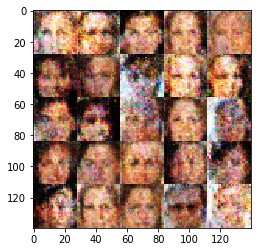

Epoch 15/20 Step 22700... Discriminator Loss: 1.4041... Generator Loss: 0.7864
Epoch 15/20 Step 22800... Discriminator Loss: 1.4022... Generator Loss: 0.7801


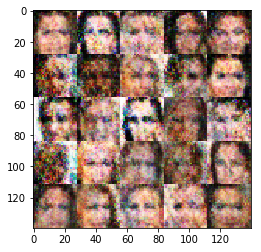

Epoch 15/20 Step 22900... Discriminator Loss: 1.3976... Generator Loss: 0.7787
Epoch 15/20 Step 23000... Discriminator Loss: 1.3995... Generator Loss: 0.7951


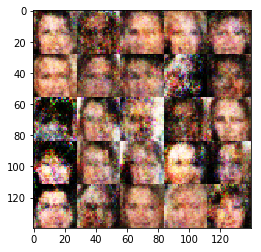

Epoch 15/20 Step 23100... Discriminator Loss: 1.4008... Generator Loss: 0.7877
Epoch 15/20 Step 23200... Discriminator Loss: 1.3991... Generator Loss: 0.7923


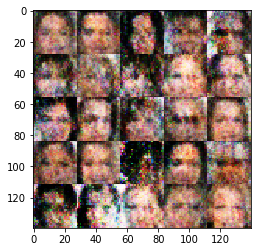

Epoch 15/20 Step 23300... Discriminator Loss: 1.4009... Generator Loss: 0.7755
Epoch 15/20 Step 23400... Discriminator Loss: 1.3976... Generator Loss: 0.7775


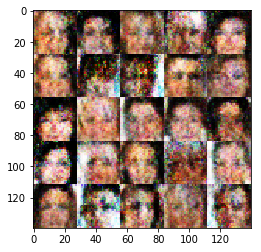

Epoch 15/20 Step 23500... Discriminator Loss: 1.4036... Generator Loss: 0.7832
Epoch 15/20 Step 23600... Discriminator Loss: 1.4010... Generator Loss: 0.7763


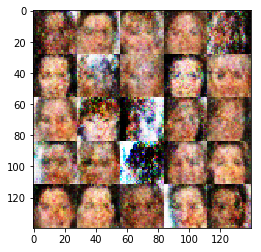

Epoch 15/20 Step 23700... Discriminator Loss: 1.3983... Generator Loss: 0.7867
Epoch 16/20 Step 23800... Discriminator Loss: 1.3993... Generator Loss: 0.7780


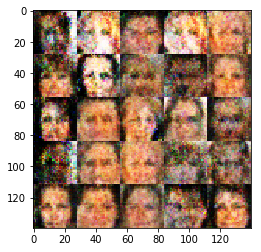

Epoch 16/20 Step 23900... Discriminator Loss: 1.4038... Generator Loss: 0.7744
Epoch 16/20 Step 24000... Discriminator Loss: 1.3959... Generator Loss: 0.7938


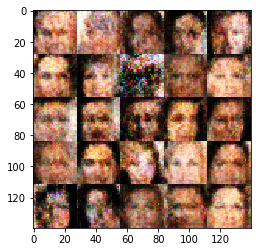

Epoch 16/20 Step 24100... Discriminator Loss: 1.3969... Generator Loss: 0.7825
Epoch 16/20 Step 24200... Discriminator Loss: 1.3976... Generator Loss: 0.7893


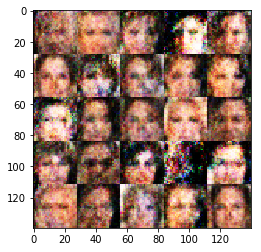

Epoch 16/20 Step 24300... Discriminator Loss: 1.3993... Generator Loss: 0.7886
Epoch 16/20 Step 24400... Discriminator Loss: 1.4003... Generator Loss: 0.7813


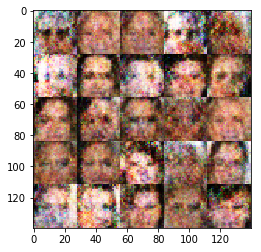

Epoch 16/20 Step 24500... Discriminator Loss: 1.3986... Generator Loss: 0.7935
Epoch 16/20 Step 24600... Discriminator Loss: 1.4014... Generator Loss: 0.7790


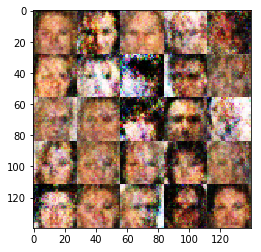

Epoch 16/20 Step 24700... Discriminator Loss: 1.3978... Generator Loss: 0.7871
Epoch 16/20 Step 24800... Discriminator Loss: 1.3996... Generator Loss: 0.7820


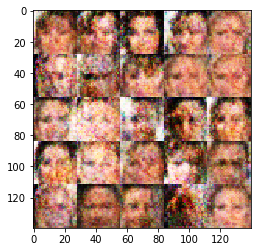

Epoch 16/20 Step 24900... Discriminator Loss: 1.3974... Generator Loss: 0.7964
Epoch 16/20 Step 25000... Discriminator Loss: 1.3981... Generator Loss: 0.7750


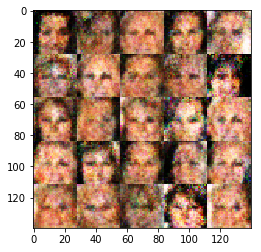

Epoch 16/20 Step 25100... Discriminator Loss: 1.3988... Generator Loss: 0.7760
Epoch 16/20 Step 25200... Discriminator Loss: 1.3966... Generator Loss: 0.7905


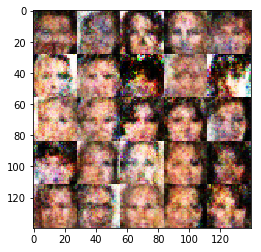

Epoch 16/20 Step 25300... Discriminator Loss: 1.4001... Generator Loss: 0.7830
Epoch 17/20 Step 25400... Discriminator Loss: 1.3970... Generator Loss: 0.7820


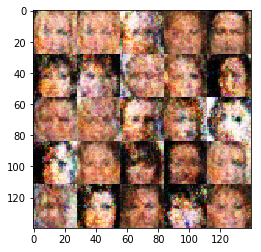

Epoch 17/20 Step 25500... Discriminator Loss: 1.3966... Generator Loss: 0.7948
Epoch 17/20 Step 25600... Discriminator Loss: 1.3979... Generator Loss: 0.7886


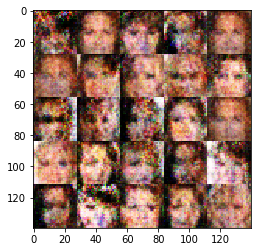

Epoch 17/20 Step 25700... Discriminator Loss: 1.3942... Generator Loss: 0.7773
Epoch 17/20 Step 25800... Discriminator Loss: 1.3973... Generator Loss: 0.8037


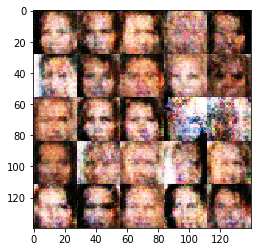

Epoch 17/20 Step 25900... Discriminator Loss: 1.4003... Generator Loss: 0.7880
Epoch 17/20 Step 26000... Discriminator Loss: 1.3946... Generator Loss: 0.7870


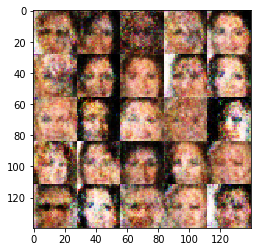

Epoch 17/20 Step 26100... Discriminator Loss: 1.3966... Generator Loss: 0.7847
Epoch 17/20 Step 26200... Discriminator Loss: 1.3953... Generator Loss: 0.7925


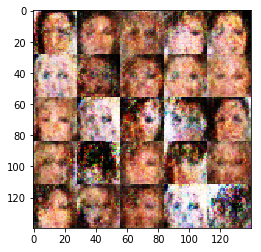

Epoch 17/20 Step 26300... Discriminator Loss: 1.3995... Generator Loss: 0.7806
Epoch 17/20 Step 26400... Discriminator Loss: 1.4005... Generator Loss: 0.7762


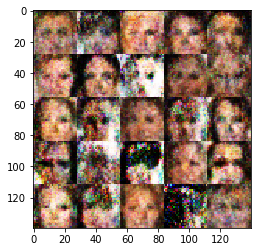

Epoch 17/20 Step 26500... Discriminator Loss: 1.3991... Generator Loss: 0.7909
Epoch 17/20 Step 26600... Discriminator Loss: 1.3968... Generator Loss: 0.7792


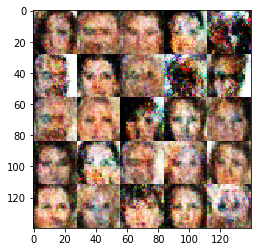

Epoch 17/20 Step 26700... Discriminator Loss: 1.4000... Generator Loss: 0.7849
Epoch 17/20 Step 26800... Discriminator Loss: 1.3948... Generator Loss: 0.7847


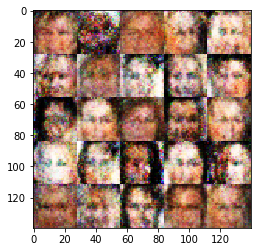

Epoch 18/20 Step 26900... Discriminator Loss: 1.3993... Generator Loss: 0.7808
Epoch 18/20 Step 27000... Discriminator Loss: 1.3943... Generator Loss: 0.7890


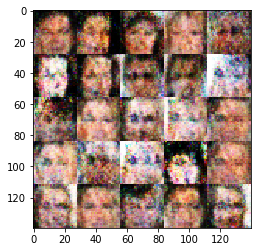

Epoch 18/20 Step 27100... Discriminator Loss: 1.3959... Generator Loss: 0.7804
Epoch 18/20 Step 27200... Discriminator Loss: 1.3976... Generator Loss: 0.7841


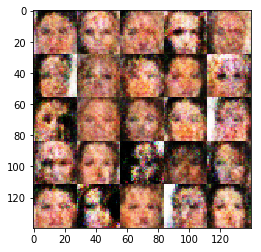

Epoch 18/20 Step 27300... Discriminator Loss: 1.3955... Generator Loss: 0.7816
Epoch 18/20 Step 27400... Discriminator Loss: 1.3937... Generator Loss: 0.7801


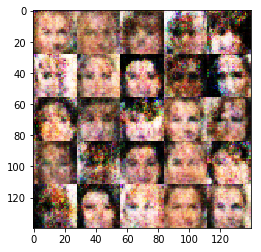

Epoch 18/20 Step 27500... Discriminator Loss: 1.3956... Generator Loss: 0.7844
Epoch 18/20 Step 27600... Discriminator Loss: 1.3974... Generator Loss: 0.7763


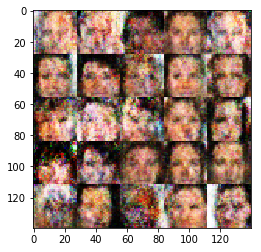

Epoch 18/20 Step 27700... Discriminator Loss: 1.3995... Generator Loss: 0.7872
Epoch 18/20 Step 27800... Discriminator Loss: 1.3985... Generator Loss: 0.7868


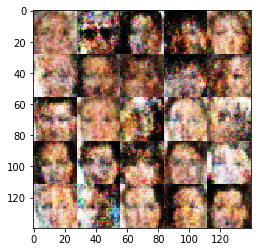

Epoch 18/20 Step 27900... Discriminator Loss: 1.3954... Generator Loss: 0.7916
Epoch 18/20 Step 28000... Discriminator Loss: 1.3940... Generator Loss: 0.7918


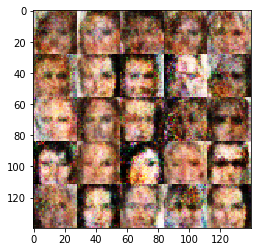

Epoch 18/20 Step 28100... Discriminator Loss: 1.3974... Generator Loss: 0.7816
Epoch 18/20 Step 28200... Discriminator Loss: 1.3965... Generator Loss: 0.7772


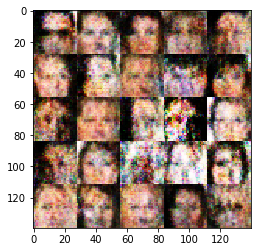

Epoch 18/20 Step 28300... Discriminator Loss: 1.3965... Generator Loss: 0.7818
Epoch 18/20 Step 28400... Discriminator Loss: 1.3969... Generator Loss: 0.7829


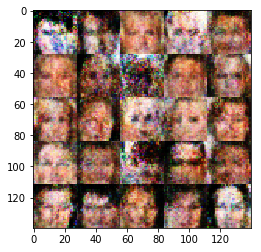

Epoch 19/20 Step 28500... Discriminator Loss: 1.3934... Generator Loss: 0.7855
Epoch 19/20 Step 28600... Discriminator Loss: 1.3924... Generator Loss: 0.7960


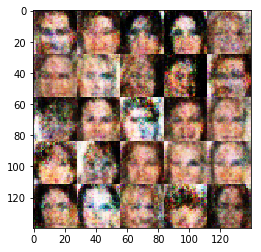

Epoch 19/20 Step 28700... Discriminator Loss: 1.3947... Generator Loss: 0.7776
Epoch 19/20 Step 28800... Discriminator Loss: 1.3929... Generator Loss: 0.7999


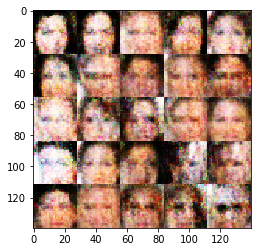

Epoch 19/20 Step 28900... Discriminator Loss: 1.3904... Generator Loss: 0.7881
Epoch 19/20 Step 29000... Discriminator Loss: 1.3929... Generator Loss: 0.7847


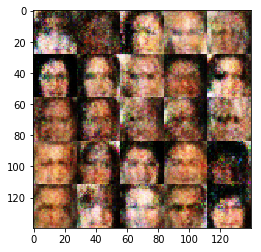

Epoch 19/20 Step 29100... Discriminator Loss: 1.3929... Generator Loss: 0.7821
Epoch 19/20 Step 29200... Discriminator Loss: 1.3986... Generator Loss: 0.7831


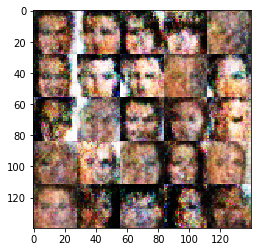

Epoch 19/20 Step 29300... Discriminator Loss: 1.3969... Generator Loss: 0.7813
Epoch 19/20 Step 29400... Discriminator Loss: 1.3928... Generator Loss: 0.7935


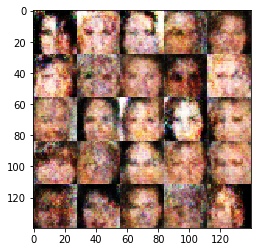

Epoch 19/20 Step 29500... Discriminator Loss: 1.3953... Generator Loss: 0.7796
Epoch 19/20 Step 29600... Discriminator Loss: 1.3941... Generator Loss: 0.7880


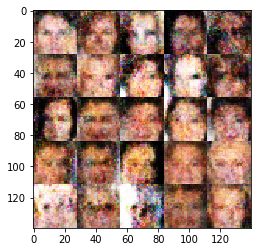

Epoch 19/20 Step 29700... Discriminator Loss: 1.3931... Generator Loss: 0.7927
Epoch 19/20 Step 29800... Discriminator Loss: 1.3998... Generator Loss: 0.7826


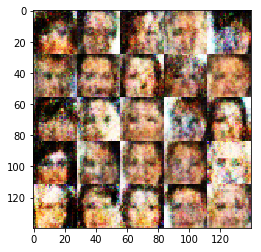

Epoch 19/20 Step 29900... Discriminator Loss: 1.3922... Generator Loss: 0.7971
Epoch 19/20 Step 30000... Discriminator Loss: 1.3945... Generator Loss: 0.7877


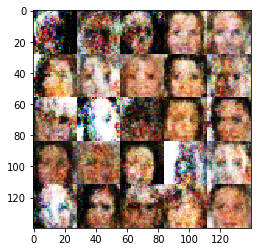

Epoch 20/20 Step 30100... Discriminator Loss: 1.3914... Generator Loss: 0.7857
Epoch 20/20 Step 30200... Discriminator Loss: 1.3898... Generator Loss: 0.8035


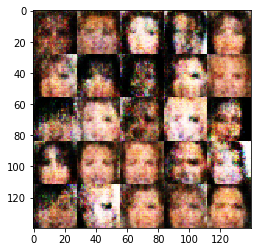

Epoch 20/20 Step 30300... Discriminator Loss: 1.3964... Generator Loss: 0.7803
Epoch 20/20 Step 30400... Discriminator Loss: 1.3883... Generator Loss: 0.7956


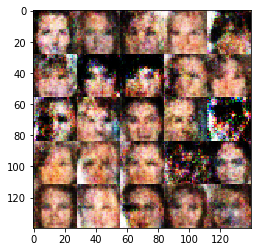

Epoch 20/20 Step 30500... Discriminator Loss: 1.3932... Generator Loss: 0.7764
Epoch 20/20 Step 30600... Discriminator Loss: 1.3945... Generator Loss: 0.7857


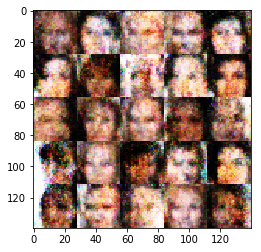

Epoch 20/20 Step 30700... Discriminator Loss: 1.3927... Generator Loss: 0.7888
Epoch 20/20 Step 30800... Discriminator Loss: 1.3954... Generator Loss: 0.7953


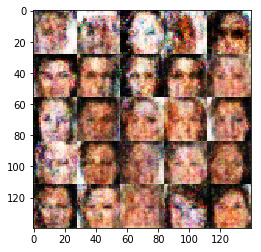

Epoch 20/20 Step 30900... Discriminator Loss: 1.3951... Generator Loss: 0.7936
Epoch 20/20 Step 31000... Discriminator Loss: 1.3932... Generator Loss: 0.7813


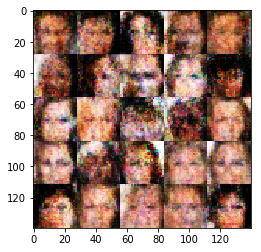

Epoch 20/20 Step 31100... Discriminator Loss: 1.3938... Generator Loss: 0.7811
Epoch 20/20 Step 31200... Discriminator Loss: 1.3934... Generator Loss: 0.7852


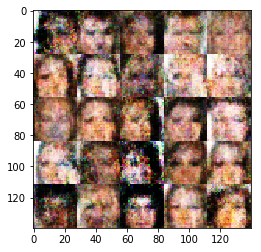

Epoch 20/20 Step 31300... Discriminator Loss: 1.3928... Generator Loss: 0.7935
Epoch 20/20 Step 31400... Discriminator Loss: 1.3923... Generator Loss: 0.7859


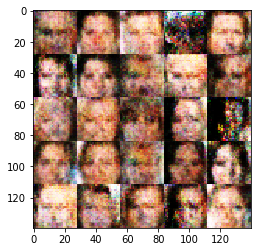

Epoch 20/20 Step 31500... Discriminator Loss: 1.3882... Generator Loss: 0.7868
Epoch 20/20 Step 31600... Discriminator Loss: 1.3935... Generator Loss: 0.7829


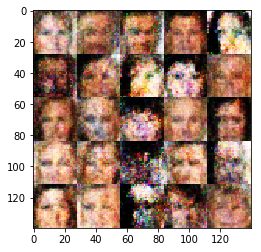

In [12]:
batch_size = 128
z_dim = 100
learning_rate = 0.0055
beta1 = 0.5

epochs = 20

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)